# BiciMAD: Analisis de alquiler de bicis en Madrid - Septiembre 2018

# Analisis Exploratorio

## 1.- Carga de datos

#### Vamos a cargar los datos procedentes de BiciMad. En primer lugar cargamos los datos de estaciones de biciMAD.

### 1.1 Datos de estaciones

In [1]:
biciBasesColClasses <- c( rep(c("factor"), times = 13) )


In [2]:
biciBases <- read.table("./data/bases_bicimad.csv", na.strings = c("","no indica", "no aporta", "NO INDICA", "NO APORTA", "000000", "NO", "N", "0", "null", "NaN", "NA", "NULL"), fileEncoding="Latin1", header = TRUE, sep = ";", dec = ".", quote="\"", colClasses = biciBasesColClasses )


In [3]:
head(biciBases)

Número,Gis_X,Gis_Y,Fecha.de.Alta,Distrito,Barrio,Calle,Nº.Finca,Tipo.de.Reserva,Número.de.Plazas,LONGITUD,LATITUD,DIRECCION
001a,"440394,55","4474280,53",41813,01 CENTRO,01-06 SOL,"PUERTA DEL SOL, PLAZA, DE LA",1 B,BiciMAD,24,-3.7025753,40.417016,"PUERTA DEL SOL, PLAZA, DE LA,1 B"
001b,"440404,21","4474287,39",41813,01 CENTRO,01-06 SOL,"ALCALA, CALLE, DE",1,BiciMAD,24,-3.7024621,40.4170785,"ALCALA, CALLE, DE,1"
2,"440134,83","4474678,23",41813,01 CENTRO,01-05 UNIVERSIDAD,"MIGUEL MOYA, CALLE, DE",1,BiciMAD,27,-3.7056739,40.42058,"MIGUEL MOYA, CALLE, DE,1"
3,"440012,98","4475760,68",41813,07 CHAMBERÍ,07-02 ARAPILES,"CONDE DEL VALLE DE SUCHIL, PLAZA, DEL",2,BiciMAD,18,-3.7072122,40.4303224,"CONDE DEL VALLE DE SUCHIL, PLAZA, DEL,2"
4,"440396,4","4475565,36",41813,01 CENTRO,01-05 UNIVERSIDAD,"MANUELA MALASAÑA, CALLE, DE",3,BiciMAD,27,-3.7026739,40.4285905,"MANUELA MALASAÑA, CALLE, DE,3"
5,"440446,9","4475539,69",41813,01 CENTRO,01-04 JUSTICIA,"FUENCARRAL, CALLE, DE",106,BiciMAD,27,-3.7020762,40.4283628,"FUENCARRAL, CALLE, DE,106"


In [4]:
str(biciBases)

'data.frame':	172 obs. of  13 variables:
 $ Número          : Factor w/ 172 levels "001a","001b",..: 1 2 90 99 110 121 132 141 152 162 ...
 $ Gis_X           : Factor w/ 172 levels "438517,07","438748,24",..: 55 57 42 34 56 59 77 82 89 27 ...
 $ Gis_Y           : Factor w/ 172 levels "4471608,61","4472071,33",..: 57 58 74 129 123 121 94 100 118 50 ...
 $ Fecha.de.Alta   : Factor w/ 10 levels "41813","41816",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ Distrito        : Factor w/ 8 levels "01  CENTRO","02  ARGANZUELA",..: 1 1 1 7 1 1 1 1 7 1 ...
 $ Barrio          : Factor w/ 34 levels "01-01 PALACIO",..: 6 6 5 29 5 4 4 4 31 1 ...
 $ Calle           : Factor w/ 127 levels "ALBERTO ALCOCER, AVENIDA, DE",..: 99 2 84 32 73 51 57 57 6 113 ...
 $ Nº.Finca        : Factor w/ 68 levels "1","1 B","10",..: 2 1 1 18 30 5 55 60 53 64 ...
 $ Tipo.de.Reserva : Factor w/ 1 level "BiciMAD": 1 1 1 1 1 1 1 1 1 1 ...
 $ Número.de.Plazas: Factor w/ 8 levels "18","21","24",..: 3 3 4 1 4 4 3 2 3 3 ...
 $ LONGITUD        

Vemos que los valores de Fecha de Alta proceden de una fecha guardada en formato Excel ( https://support.office.com/en-us/article/date-function-e36c0c8c-4104-49da-ab83-82328b832349 ) que guarda el número de días transcurridos desde el 1 Enero de 1900. Procedemos a convertir en una fecha inteligible por R. 

Crearemos una nueva variable llamada 'FechaAlta' con este valor

In [5]:
biciBases$FechaAlta <- as.POSIXct(as.numeric(as.character(biciBases$Fecha.de.Alta)) * (60*60*24) , origin="1899-12-30" , tz="GMT")


In [6]:
str(biciBases)

'data.frame':	172 obs. of  14 variables:
 $ Número          : Factor w/ 172 levels "001a","001b",..: 1 2 90 99 110 121 132 141 152 162 ...
 $ Gis_X           : Factor w/ 172 levels "438517,07","438748,24",..: 55 57 42 34 56 59 77 82 89 27 ...
 $ Gis_Y           : Factor w/ 172 levels "4471608,61","4472071,33",..: 57 58 74 129 123 121 94 100 118 50 ...
 $ Fecha.de.Alta   : Factor w/ 10 levels "41813","41816",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ Distrito        : Factor w/ 8 levels "01  CENTRO","02  ARGANZUELA",..: 1 1 1 7 1 1 1 1 7 1 ...
 $ Barrio          : Factor w/ 34 levels "01-01 PALACIO",..: 6 6 5 29 5 4 4 4 31 1 ...
 $ Calle           : Factor w/ 127 levels "ALBERTO ALCOCER, AVENIDA, DE",..: 99 2 84 32 73 51 57 57 6 113 ...
 $ Nº.Finca        : Factor w/ 68 levels "1","1 B","10",..: 2 1 1 18 30 5 55 60 53 64 ...
 $ Tipo.de.Reserva : Factor w/ 1 level "BiciMAD": 1 1 1 1 1 1 1 1 1 1 ...
 $ Número.de.Plazas: Factor w/ 8 levels "18","21","24",..: 3 3 4 1 4 4 3 2 3 3 ...
 $ LONGITUD        

In [7]:
biciBases$NumeroPlazas <- as.numeric(as.character(biciBases[["Número.de.Plazas"]]))

In [8]:
head(biciBases)

Número,Gis_X,Gis_Y,Fecha.de.Alta,Distrito,Barrio,Calle,Nº.Finca,Tipo.de.Reserva,Número.de.Plazas,LONGITUD,LATITUD,DIRECCION,FechaAlta,NumeroPlazas
001a,"440394,55","4474280,53",41813,01 CENTRO,01-06 SOL,"PUERTA DEL SOL, PLAZA, DE LA",1 B,BiciMAD,24,-3.7025753,40.417016,"PUERTA DEL SOL, PLAZA, DE LA,1 B",2014-06-23,24
001b,"440404,21","4474287,39",41813,01 CENTRO,01-06 SOL,"ALCALA, CALLE, DE",1,BiciMAD,24,-3.7024621,40.4170785,"ALCALA, CALLE, DE,1",2014-06-23,24
2,"440134,83","4474678,23",41813,01 CENTRO,01-05 UNIVERSIDAD,"MIGUEL MOYA, CALLE, DE",1,BiciMAD,27,-3.7056739,40.42058,"MIGUEL MOYA, CALLE, DE,1",2014-06-23,27
3,"440012,98","4475760,68",41813,07 CHAMBERÍ,07-02 ARAPILES,"CONDE DEL VALLE DE SUCHIL, PLAZA, DEL",2,BiciMAD,18,-3.7072122,40.4303224,"CONDE DEL VALLE DE SUCHIL, PLAZA, DEL,2",2014-06-23,18
4,"440396,4","4475565,36",41813,01 CENTRO,01-05 UNIVERSIDAD,"MANUELA MALASAÑA, CALLE, DE",3,BiciMAD,27,-3.7026739,40.4285905,"MANUELA MALASAÑA, CALLE, DE,3",2014-06-23,27
5,"440446,9","4475539,69",41813,01 CENTRO,01-04 JUSTICIA,"FUENCARRAL, CALLE, DE",106,BiciMAD,27,-3.7020762,40.4283628,"FUENCARRAL, CALLE, DE,106",2014-06-23,27


.. Y eliminamos las variables antiguas que ya hemos transformado y convertido en variables distintas:

In [9]:
biciBases[["Número.de.Plazas"]] <- NULL
biciBases[["Fecha.de.Alta"]] <- NULL

In [10]:
str(biciBases)

'data.frame':	172 obs. of  13 variables:
 $ Número         : Factor w/ 172 levels "001a","001b",..: 1 2 90 99 110 121 132 141 152 162 ...
 $ Gis_X          : Factor w/ 172 levels "438517,07","438748,24",..: 55 57 42 34 56 59 77 82 89 27 ...
 $ Gis_Y          : Factor w/ 172 levels "4471608,61","4472071,33",..: 57 58 74 129 123 121 94 100 118 50 ...
 $ Distrito       : Factor w/ 8 levels "01  CENTRO","02  ARGANZUELA",..: 1 1 1 7 1 1 1 1 7 1 ...
 $ Barrio         : Factor w/ 34 levels "01-01 PALACIO",..: 6 6 5 29 5 4 4 4 31 1 ...
 $ Calle          : Factor w/ 127 levels "ALBERTO ALCOCER, AVENIDA, DE",..: 99 2 84 32 73 51 57 57 6 113 ...
 $ Nº.Finca       : Factor w/ 68 levels "1","1 B","10",..: 2 1 1 18 30 5 55 60 53 64 ...
 $ Tipo.de.Reserva: Factor w/ 1 level "BiciMAD": 1 1 1 1 1 1 1 1 1 1 ...
 $ LONGITUD       : Factor w/ 172 levels "-3.669099","-3.6692614",..: 118 116 131 140 119 114 96 91 85 146 ...
 $ LATITUD        : Factor w/ 172 levels "40.3929735","40.3971621",..: 57 58 74 128 

In [11]:
unique(biciBases$Tipo.de.Reserva)

[1] BiciMAD
Levels: BiciMAD

Como vemos, la variable 'Tipo.de.Reserva' es unica ya que tenemos datos de alquiler de BiciMAD, por lo que no es una variable representativa: podemos eliminarla. Igualmente tenemos variables de las que podemos prescindir, como 'GisX' y 'GisY', ya que tenemos las coordenadas que tambien representan la posición de las estaciones, pero en un sistema de referencia diferente. Tambien tenemos 'Calle' y 'Nº.Finca' que estan agregadas en la 'DIRECCION', estando por tanto 'duplicadas' ( dado que solo agregan valor a nivel informativo, podremos prescindir de ellas ).
Seleccionamos por tanto las variables que creemos importantes:

In [12]:
library(dplyr)

bikeStations <- biciBases %>% select(Número, DIRECCION, Distrito, Barrio, LONGITUD, LATITUD, NumeroPlazas, FechaAlta)


Attaching package: ‘dplyr’

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



In [13]:
head(bikeStations)

Número,DIRECCION,Distrito,Barrio,LONGITUD,LATITUD,NumeroPlazas,FechaAlta
001a,"PUERTA DEL SOL, PLAZA, DE LA,1 B",01 CENTRO,01-06 SOL,-3.7025753,40.417016,24,2014-06-23
001b,"ALCALA, CALLE, DE,1",01 CENTRO,01-06 SOL,-3.7024621,40.4170785,24,2014-06-23
2,"MIGUEL MOYA, CALLE, DE,1",01 CENTRO,01-05 UNIVERSIDAD,-3.7056739,40.42058,27,2014-06-23
3,"CONDE DEL VALLE DE SUCHIL, PLAZA, DEL,2",07 CHAMBERÍ,07-02 ARAPILES,-3.7072122,40.4303224,18,2014-06-23
4,"MANUELA MALASAÑA, CALLE, DE,3",01 CENTRO,01-05 UNIVERSIDAD,-3.7026739,40.4285905,27,2014-06-23
5,"FUENCARRAL, CALLE, DE,106",01 CENTRO,01-04 JUSTICIA,-3.7020762,40.4283628,27,2014-06-23


In [14]:
bikeStations

Número,DIRECCION,Distrito,Barrio,LONGITUD,LATITUD,NumeroPlazas,FechaAlta
001a,"PUERTA DEL SOL, PLAZA, DE LA,1 B",01 CENTRO,01-06 SOL,-3.7025753,40.417016,24,2014-06-23
001b,"ALCALA, CALLE, DE,1",01 CENTRO,01-06 SOL,-3.7024621,40.4170785,24,2014-06-23
2,"MIGUEL MOYA, CALLE, DE,1",01 CENTRO,01-05 UNIVERSIDAD,-3.7056739,40.42058,27,2014-06-23
3,"CONDE DEL VALLE DE SUCHIL, PLAZA, DEL,2",07 CHAMBERÍ,07-02 ARAPILES,-3.7072122,40.4303224,18,2014-06-23
4,"MANUELA MALASAÑA, CALLE, DE,3",01 CENTRO,01-05 UNIVERSIDAD,-3.7026739,40.4285905,27,2014-06-23
5,"FUENCARRAL, CALLE, DE,106",01 CENTRO,01-04 JUSTICIA,-3.7020762,40.4283628,27,2014-06-23
6,"HORTALEZA, CALLE, DE,63",01 CENTRO,01-04 JUSTICIA,-3.6984093,40.4241633,24,2014-06-23
7,"HORTALEZA, CALLE, DE,75",01 CENTRO,01-04 JUSTICIA,-3.6977399,40.4252161,21,2014-06-23
8,"ALONSO MARTINEZ, PLAZA, DE,6",07 CHAMBERÍ,07-04 ALMAGRO,-3.6953067,40.4277143,24,2014-06-23
9,"SAN MIGUEL, PLAZA, DE,9",01 CENTRO,01-01 PALACIO,-3.7094093,40.4156134,24,2014-06-23


Vemos que el 'Número' que identifica a la estación puede estar dividido por posibles ampliaciones o al ser texto, puede empezar por 0's y estar seguido por a,b,c....
Sin embargo, en el fichero de uso de las bicis, aparece simplemente el identificador númerico de la estación. Por lo tanto vamos a modificar la variable 'Número' haciendo que sea un valor númerico y posteriormente agruparemos las estaciones por este identificador. Vamos a usar una expresión regular para extraer este valor ( usaremos el paquete de R 'stringr' perteneciente al conjunto 'tidyverse' y aplicaremos esta expresión regular a todos los valores del dataframe utilizando la función apply.

In [15]:
library(stringr)
extractID <- function(x) str_extract(x, "[1-9][0-9]*")
bikeStations$idStation <- sapply( bikeStations[["Número"]], extractID )

In [16]:
head(bikeStations)

Número,DIRECCION,Distrito,Barrio,LONGITUD,LATITUD,NumeroPlazas,FechaAlta,idStation
001a,"PUERTA DEL SOL, PLAZA, DE LA,1 B",01 CENTRO,01-06 SOL,-3.7025753,40.417016,24,2014-06-23,1
001b,"ALCALA, CALLE, DE,1",01 CENTRO,01-06 SOL,-3.7024621,40.4170785,24,2014-06-23,1
2,"MIGUEL MOYA, CALLE, DE,1",01 CENTRO,01-05 UNIVERSIDAD,-3.7056739,40.42058,27,2014-06-23,2
3,"CONDE DEL VALLE DE SUCHIL, PLAZA, DEL,2",07 CHAMBERÍ,07-02 ARAPILES,-3.7072122,40.4303224,18,2014-06-23,3
4,"MANUELA MALASAÑA, CALLE, DE,3",01 CENTRO,01-05 UNIVERSIDAD,-3.7026739,40.4285905,27,2014-06-23,4
5,"FUENCARRAL, CALLE, DE,106",01 CENTRO,01-04 JUSTICIA,-3.7020762,40.4283628,27,2014-06-23,5


Comprobamos que hemos extraido bien el Identificador y procedemos a eliminar la variable 'Número'

In [17]:
bikeStations[["Número"]] <- NULL

In [18]:
nrow(bikeStations)
length(unique(bikeStations$idStation))

[1] 172

[1] 165

Convertimos el 'idStation' de 'character' a 'numerico'

In [19]:
bikeStations$idStation <- as.numeric(bikeStations$idStation)

Vamos a utilizar funcionalidades de agregación del paquete 'dplyr' para unir todas las subestaciones que pertenecen a la misma estación sumando el número de bicicletas que tienen. Nos da igual coger una dirección u otra, ya que estaran muy próximas y tienen un mero valor informativo, así utilizaremos la función MIN que nos permitira recoger la fecha menos reciente como fecha de inauguración ( aunque posteriormente haya habido ampliaciones )

In [20]:
bikeStations <- bikeStations %>% group_by(idStation) %>% summarize(address = first(DIRECCION),  neighborhood = first(Barrio), district = first(Distrito), long = first(LONGITUD), lat = first(LATITUD), totalPlaces = sum(NumeroPlazas, na.rm=T), startDate = min(FechaAlta), numberSubstations = n() )

In [21]:
str(bikeStations)

Classes ‘tbl_df’, ‘tbl’ and 'data.frame':	165 obs. of  9 variables:
 $ idStation        : num  1 2 3 4 5 6 7 8 9 10 ...
 $ address          : Factor w/ 159 levels "ALBERTO ALCOCER, AVENIDA, DE,22 A",..: 122 104 43 91 63 71 72 11 137 96 ...
 $ neighborhood     : Factor w/ 34 levels "01-01 PALACIO",..: 6 5 29 5 4 4 4 31 1 4 ...
 $ district         : Factor w/ 8 levels "01  CENTRO","02  ARGANZUELA",..: 1 1 7 1 1 1 1 7 1 1 ...
 $ long             : Factor w/ 172 levels "-3.669099","-3.6692614",..: 118 131 140 119 114 96 91 85 146 70 ...
 $ lat              : Factor w/ 172 levels "40.3929735","40.3971621",..: 57 74 128 123 121 94 100 118 50 102 ...
 $ totalPlaces      : num  48 27 18 27 27 24 21 24 24 24 ...
 $ startDate        : POSIXct, format: "2014-06-23" "2014-06-23" ...
 $ numberSubstations: int  2 1 1 1 1 1 1 1 1 1 ...


In [22]:
bikeStations

idStation,address,neighborhood,district,long,lat,totalPlaces,startDate,numberSubstations
1,"PUERTA DEL SOL, PLAZA, DE LA,1 B",01-06 SOL,01 CENTRO,-3.7025753,40.417016,48,2014-06-23,2
2,"MIGUEL MOYA, CALLE, DE,1",01-05 UNIVERSIDAD,01 CENTRO,-3.7056739,40.42058,27,2014-06-23,1
3,"CONDE DEL VALLE DE SUCHIL, PLAZA, DEL,2",07-02 ARAPILES,07 CHAMBERÍ,-3.7072122,40.4303224,18,2014-06-23,1
4,"MANUELA MALASAÑA, CALLE, DE,3",01-05 UNIVERSIDAD,01 CENTRO,-3.7026739,40.4285905,27,2014-06-23,1
5,"FUENCARRAL, CALLE, DE,106",01-04 JUSTICIA,01 CENTRO,-3.7020762,40.4283628,27,2014-06-23,1
6,"HORTALEZA, CALLE, DE,63",01-04 JUSTICIA,01 CENTRO,-3.6984093,40.4241633,24,2014-06-23,1
7,"HORTALEZA, CALLE, DE,75",01-04 JUSTICIA,01 CENTRO,-3.6977399,40.4252161,21,2014-06-23,1
8,"ALONSO MARTINEZ, PLAZA, DE,6",07-04 ALMAGRO,07 CHAMBERÍ,-3.6953067,40.4277143,24,2014-06-23,1
9,"SAN MIGUEL, PLAZA, DE,9",01-01 PALACIO,01 CENTRO,-3.7094093,40.4156134,24,2014-06-23,1
10,"MARQUES DE LA ENSENADA, CALLE, DEL,16",01-04 JUSTICIA,01 CENTRO,-3.6920816,40.4254027,24,2014-06-23,1


Veamos la ubicación de las estaciones de BiciMAD en un mapa.
Utilizamos para ello el paquete 'leaflet' que nos permite dibujar mapas y puntos sobre el, siendo estos puntos coordenadas en el sistema de referencia EPSG:4326.

In [23]:
library(leaflet)

In [24]:
leaflet(data = bikeStations, height = "700px") %>% 
#    addTiles() %>% 
#    addProviderTiles(providers$Stamen.Toner) %>%
    addProviderTiles(providers$CartoDB.Positron) %>%
    addMarkers(clusterOptions = markerClusterOptions(), ~as.numeric(as.character(long)), ~as.numeric(as.character(lat)), popup = ~as.character(address), label = ~as.character(neighborhood))

HTML widgets cannot be represented in plain text (need html)

El mapa ya nos da una visión general de la distribución de estaciones en Madrid, pero podemos profundizar un poco viendo las distribución por barrio, o por distrito:

In [25]:
library(ggplot2)

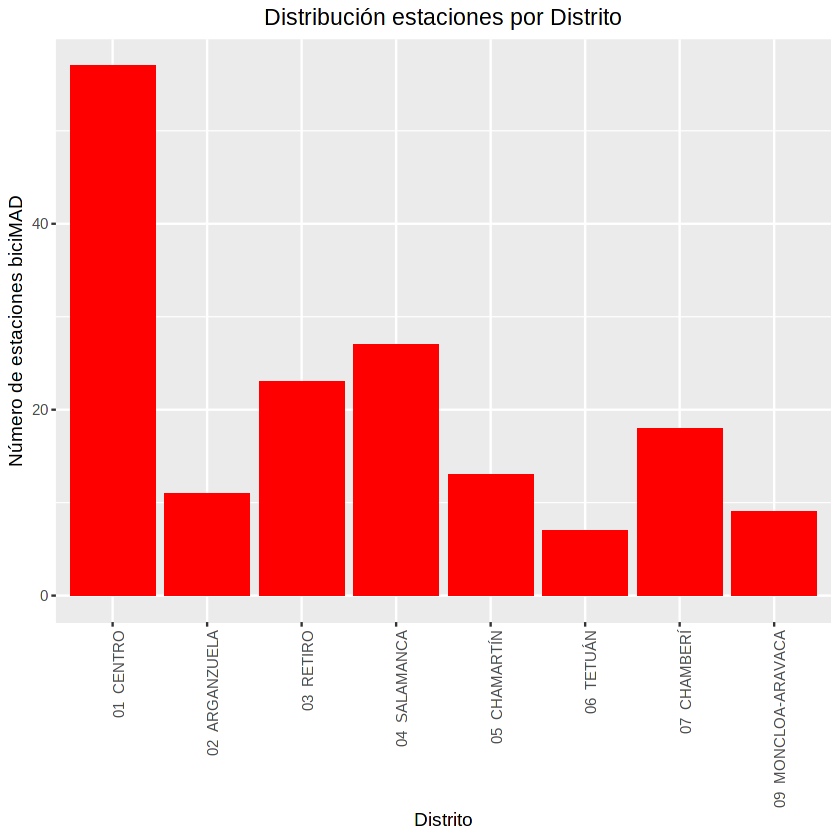

In [26]:
ggplot(bikeStations, aes(x = district)) + 
    geom_bar(position = "stack", fill = 'red', show.legend = FALSE) + 
    xlab("Distrito") + 
    ylab("Número de estaciones biciMAD") + 
    ggtitle("Distribución estaciones por Distrito") + 
    theme(plot.title = element_text(hjust = 0.5), axis.text.x = element_text(angle = 90, hjust = 1))

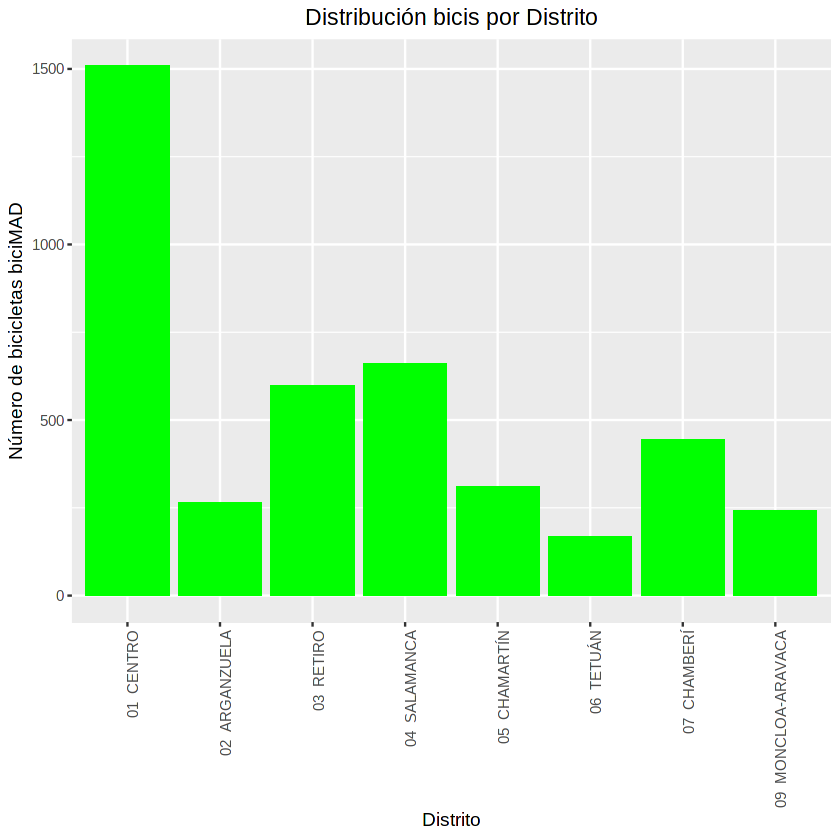

In [27]:
ggplot(bikeStations, aes(x = district, y = totalPlaces))  + 
    stat_summary(fun.y = sum, geom = "bar", fill = 'green' ) +
    xlab("Distrito") + 
    ylab("Número de bicicletas biciMAD") + 
    ggtitle("Distribución bicis por Distrito") + 
    theme(plot.title = element_text(hjust = 0.5), axis.text.x = element_text(angle = 90, hjust = 1))

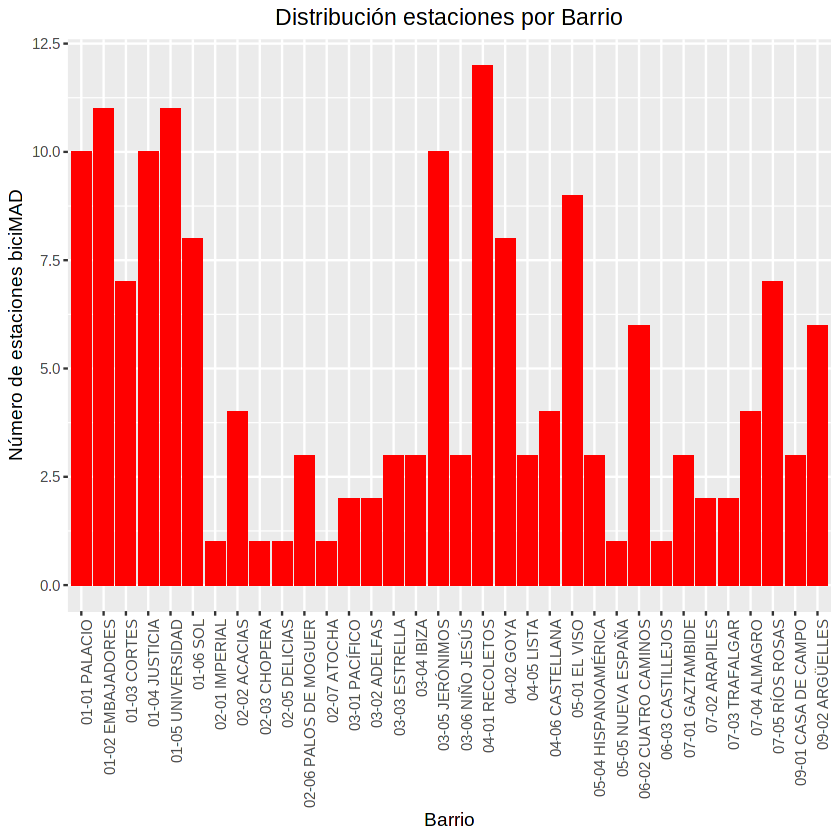

In [28]:
ggplot(bikeStations, aes(x = neighborhood)) + 
    geom_bar(position = "stack", fill = 'red', show.legend = FALSE) + 
    xlab("Barrio") + 
    ylab("Número de estaciones biciMAD") + 
    ggtitle("Distribución estaciones por Barrio") + 
    theme(plot.title = element_text(hjust = 0.5), axis.text.x = element_text(angle = 90, hjust = 1))

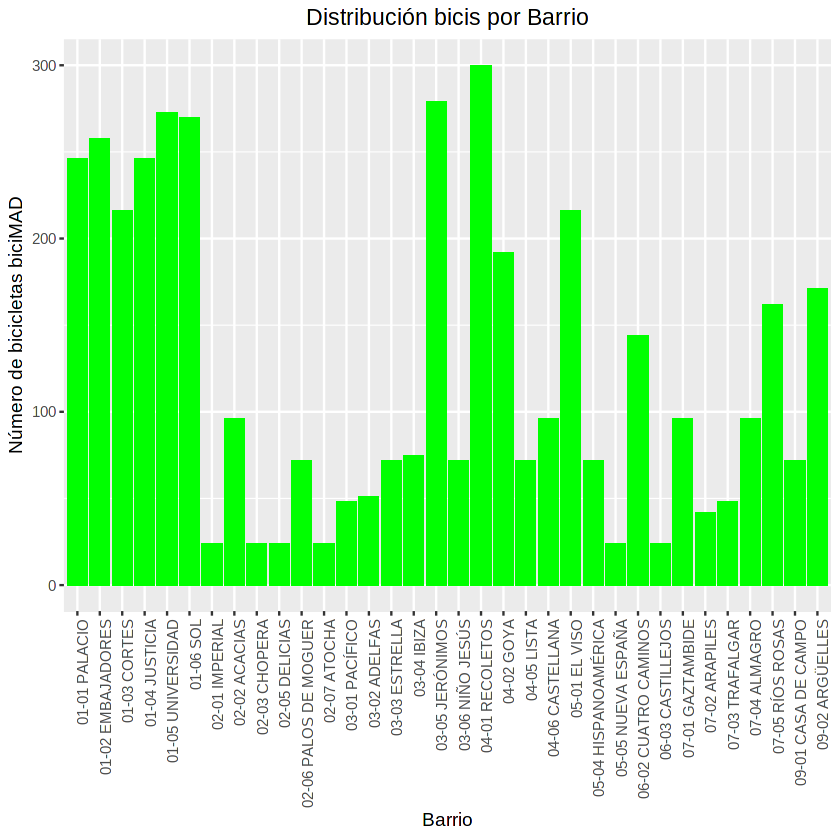

In [29]:
ggplot(bikeStations, aes(x = neighborhood, y = totalPlaces))  + 
    stat_summary(fun.y = sum, geom = "bar", fill = 'green' ) + 
    xlab("Barrio") + 
    ylab("Número de bicicletas biciMAD") + 
    ggtitle("Distribución bicis por Barrio") + 
    theme(plot.title = element_text(hjust = 0.5), axis.text.x = element_text(angle = 90, hjust = 1))

Como vemos la distribución de estaciones y bicicletas es practicamente identica, lo que nos hace pensar que el número de bicis que alberga cada estación es el mismo. Veamoslo.

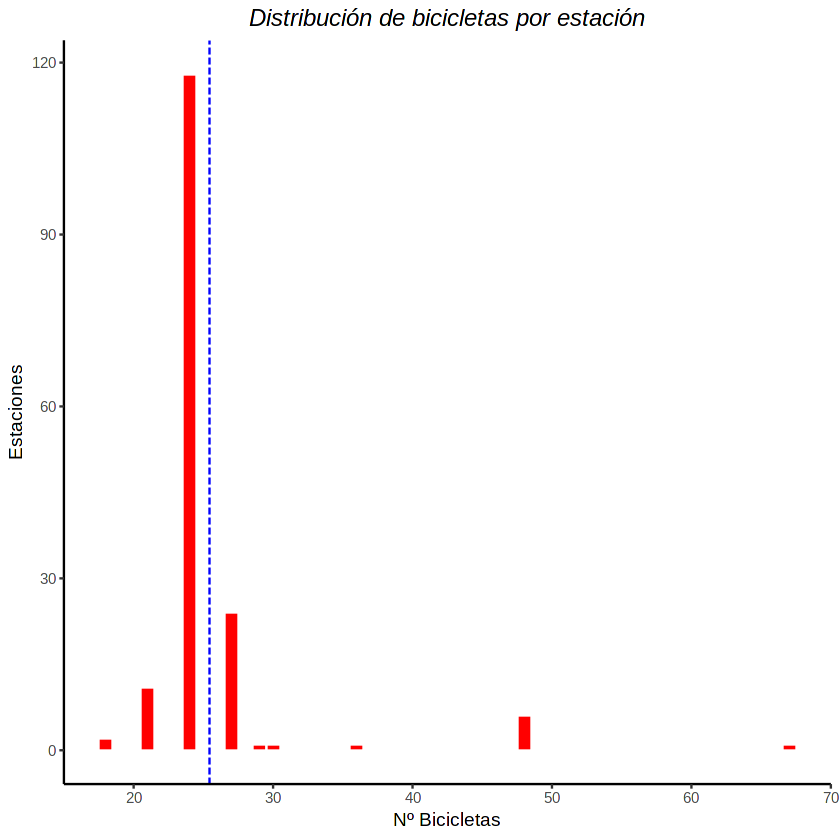

In [30]:
ggplot(bikeStations, aes(totalPlaces)) + 
    geom_histogram(binwidth = 1, col = "white", fill = "red", na.rm = TRUE ) + 
    xlab("Nº Bicicletas") + 
    ylab("Estaciones") + 
    theme_bw() + 
    theme(panel.border = element_blank(), panel.grid.major = element_blank(), panel.grid.minor = element_blank(), axis.line = element_line(colour = "black")) + 
    ggtitle("Distribución de bicicletas por estación") + theme( plot.title = element_text(color="black", size=14, face="italic", hjust = 0.5)) + geom_vline(xintercept = mean(bikeStations$totalPlaces), colour="blue", linetype = "longdash")

In [31]:
100*table(bikeStations$totalPlaces)/nrow(bikeStations)


        18         21         24         27         29         30         36 
 1.2121212  6.6666667 71.5151515 14.5454545  0.6060606  0.6060606  0.6060606 
        48         67 
 3.6363636  0.6060606 

Efectivamente, podemos ver que el **71.5%** de las estaciones tienen **24 bicicletas** y la media es de 25 bicicletas por estación

### 1.2.- Datos de uso

In [32]:
biciDataColClasses <- c( rep(c("factor"), times = 2), rep(c("numeric"), times = 6), rep(c("factor"), times = 3) )


In [33]:
biciData <- read.table("./data/bike_data.csv", na.strings = c("","no indica", "no aporta", "NO INDICA", "NO APORTA", "000000", "NO", "N", "0", "null", "NaN", "NA", "NULL"), fileEncoding="UTF-8", header = TRUE, sep = ",", dec = ".", quote="\"", colClasses = biciDataColClasses ) 

In [34]:
str(biciData)

'data.frame':	398040 obs. of  11 variables:
 $ id              : Factor w/ 398040 levels "5b9058462f38434ab0d85cd3",..: 1 2 3 4 5 6 7 8 9 10 ...
 $ user_day_code   : Factor w/ 219444 levels "00005508f0af82d32e29aa27f87f8017fba34e8efd56afac2c23ad3da03ce2b3",..: 201410 56543 102936 139147 115644 167696 163303 23345 5725 31220 ...
 $ idplug_base     : num  5 12 1 1 19 20 15 2 3 11 ...
 $ idunplug_base   : num  17 26 11 1 8 11 16 24 1 3 ...
 $ idplug_station  : num  16 52 58 120 80 49 49 15 91 57 ...
 $ idunplug_station: num  40 85 109 168 89 57 57 168 102 42 ...
 $ user_type       : num  1 1 1 1 1 1 1 1 1 1 ...
 $ travel_time     : num  263 382 305 262 310 373 408 303 360 302 ...
 $ ageRange        : Factor w/ 6 levels "1","2","3","4",..: NA 2 4 4 4 NA 4 NA 3 5 ...
 $ unplug_hourTime : Factor w/ 656 levels "2018-09-01T01:00:00.000+0200",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ zip_code        : Factor w/ 495 levels " "," 2800","00000",..: NA 138 131 144 135 NA 135 NA 152 133 ...


In [35]:
unique(biciData$user_type)

[1]  1  3  2 NA

Según el diccionario de variables, para usuarios desconocidos la variable 'user_type' es 0 sin embargo vemos que aparece como NA. Remplazamos los valores NA por 0's

In [36]:
biciData$user_type[is.na(biciData$user_type)] <- 0

In [37]:
unique(biciData$user_type)

[1] 1 3 2 0

Ahora podemos convertir la variable númerica 'user_type' a factor, ya que como tal es una etiqueta que no representa orden ni cantidad. 

In [38]:
biciData$user_type <- factor(biciData$user_type)

Vamos a convertir la variable 'unplug_hourTime' en una variable fecha-hora y vamos a extraer de aqui otras variables de interes como puede ser el día, la hora, o el dia de la semana.

In [39]:
biciData$unplug_hourTime <- as.POSIXlt(biciData$unplug_hourTime, format = "%Y-%m-%dT%H:%M:%S")
biciData$unplug_date <- as.Date(biciData$unplug_hourTime, format = "%Y-%m-%dT%H:%M:%S") 
biciData$unplug_hour <- strftime(biciData$unplug_hourTime, format="%H:%M:%S")
biciData$unplug_dayOfWeek <- weekdays(biciData$unplug_date)

biciData$unplug_hourTime <- as.POSIXct(biciData$unplug_hourTime, format = "%Y-%m-%dT%H:%M:%S")

In [40]:
str(biciData)

'data.frame':	398040 obs. of  14 variables:
 $ id              : Factor w/ 398040 levels "5b9058462f38434ab0d85cd3",..: 1 2 3 4 5 6 7 8 9 10 ...
 $ user_day_code   : Factor w/ 219444 levels "00005508f0af82d32e29aa27f87f8017fba34e8efd56afac2c23ad3da03ce2b3",..: 201410 56543 102936 139147 115644 167696 163303 23345 5725 31220 ...
 $ idplug_base     : num  5 12 1 1 19 20 15 2 3 11 ...
 $ idunplug_base   : num  17 26 11 1 8 11 16 24 1 3 ...
 $ idplug_station  : num  16 52 58 120 80 49 49 15 91 57 ...
 $ idunplug_station: num  40 85 109 168 89 57 57 168 102 42 ...
 $ user_type       : Factor w/ 4 levels "0","1","2","3": 2 2 2 2 2 2 2 2 2 2 ...
 $ travel_time     : num  263 382 305 262 310 373 408 303 360 302 ...
 $ ageRange        : Factor w/ 6 levels "1","2","3","4",..: NA 2 4 4 4 NA 4 NA 3 5 ...
 $ unplug_hourTime : POSIXct, format: "2018-09-01 01:00:00" "2018-09-01 01:00:00" ...
 $ zip_code        : Factor w/ 495 levels " "," 2800","00000",..: NA 138 131 144 135 NA 135 NA 152 133 ...
 $ 

Veamos el número de viajes realizados cada día, segmentados por el tipo de usuario

In [41]:
travelByDate <- biciData %>% group_by(user_type, unplug_date) %>% summarise( travels = n() ) %>% as.data.frame() 


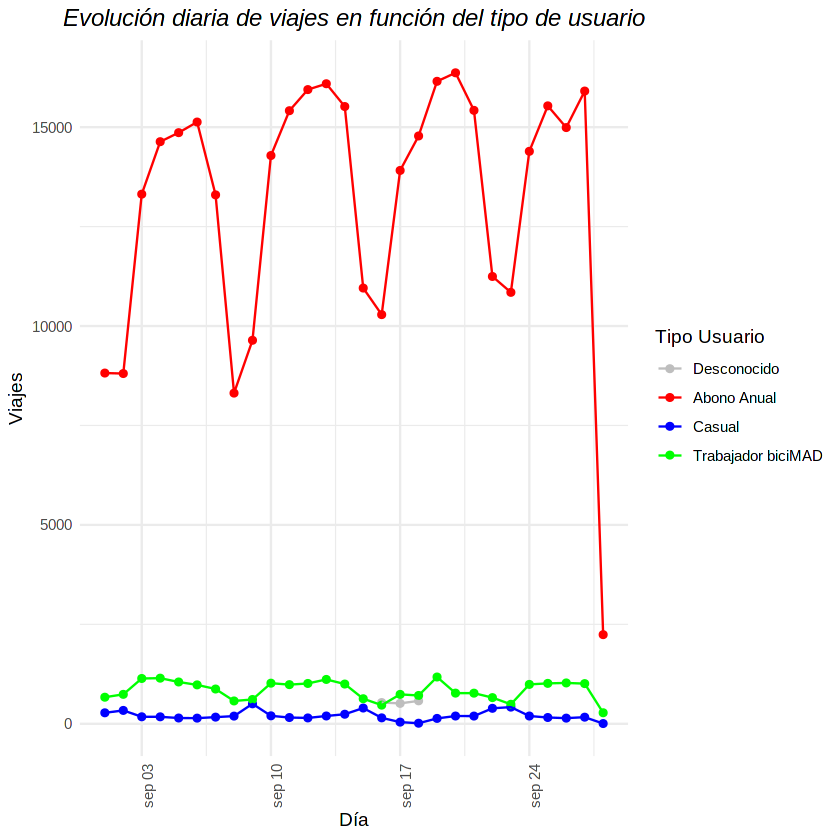

In [42]:
ggplot(travelByDate, aes(x = unplug_date, y = travels, colour = user_type)) + 
  geom_point() + 
  labs(colour = "Tipo Usuario") +
  scale_color_manual(labels = c("Desconocido", "Abono Anual", "Casual", "Trabajador biciMAD" ), values=c('grey','red','blue','green')) +
  geom_line() +
  xlab("Día") + 
  scale_y_continuous("Viajes") +
  theme_minimal() +
  ggtitle("Evolución diaria de viajes en función del tipo de usuario") + 
  theme( plot.title = element_text(color="black", size=14, face="italic", hjust = 0.5), axis.text.x = element_text(angle = 90, hjust = 1))

De esta distribución de viajes podemos sacar varias conclusiones: 
- Durante 3 días ( 16, 17 y 18 ) hubo viajes de los que no se pudo registrar el tipo de usuario.
- Hay movimientos que son realizados por la empresa para calibrar las bicicletas que hay en cada estación.
- Hay un incremento de ~40%-50% entre semana de los viajes realizados por usuarios con abono anual, lo cual nos hace pensar que hay una gran masa social que utiliza las bicis para ir a trabajar. Tambien se aprecia un aumento de los viajes realizados por usuarios 'casuales' durante el fin de semana.
- La caida de viajes que se aprecia el 28 de Septiembre puede responder a que los datos no esten completos para ese día ya que es el último del que disponemos de datos

Veamos la distribución de viajes segmentados por dia de la semana

In [43]:
travelByDayOfWeek <- biciData %>% group_by(user_type, unplug_dayOfWeek) %>% summarise( travels = n() ) %>% as.data.frame()

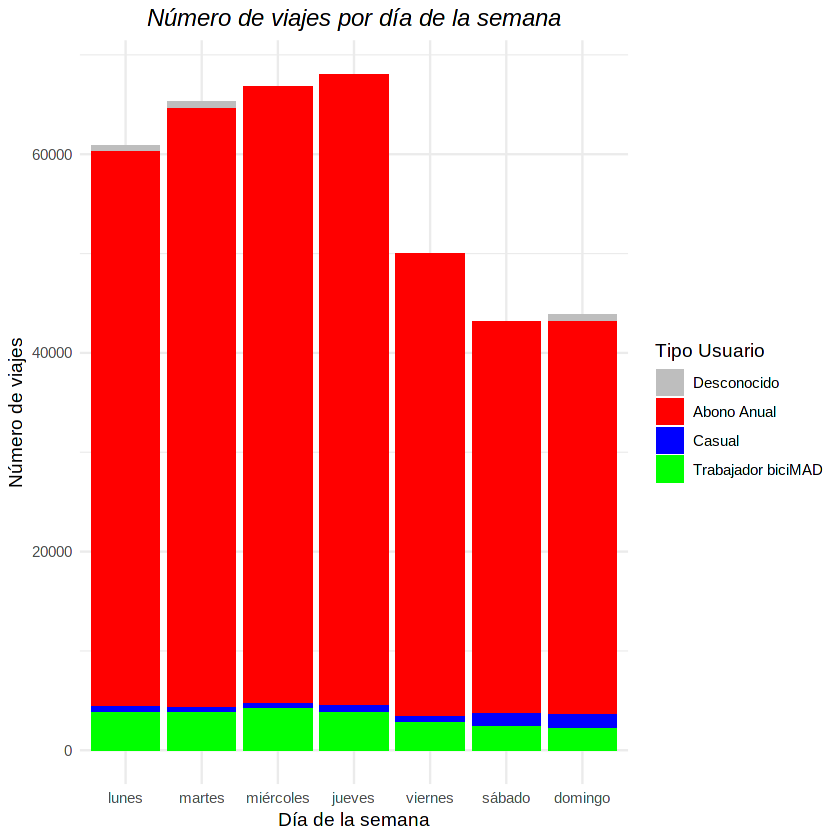

In [44]:
position <- c("lunes","martes","miércoles","jueves","viernes","sábado","domingo")
ggplot(travelByDayOfWeek) + 
    geom_bar(stat="identity", aes(x = unplug_dayOfWeek, y = travels, fill=user_type)) +
    labs(fill = "Tipo Usuario") +
    scale_fill_manual(labels = c("Desconocido", "Abono Anual", "Casual", "Trabajador biciMAD" ), values=c('grey','red','blue','green')) +
    xlab("Día de la semana") +
    scale_x_discrete(limits = position) +
    ylab("Número de viajes") +
    theme_minimal() +
    ggtitle("Número de viajes por día de la semana") + 
    theme( plot.title = element_text(color="black", size=14, face="italic", hjust = 0.5))

Veamos ahora como se distribuyen los viajes por horas segmentando por el día de la semana.

In [45]:
travelByHourOfDay <- biciData %>% group_by(unplug_dayOfWeek, unplug_hour) %>% summarise( travels = n() ) %>% as.data.frame()

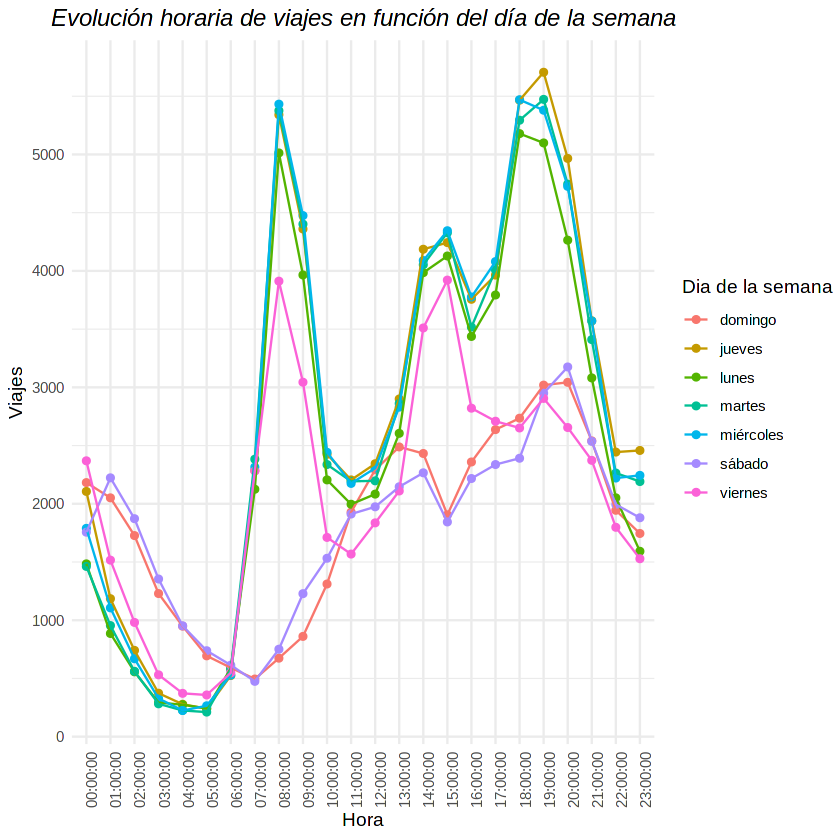

In [46]:
ggplot(travelByHourOfDay, aes(x = unplug_hour, y = travels, color = unplug_dayOfWeek, group = unplug_dayOfWeek)) + 
  geom_point() + 
  geom_line() +
  labs(color = "Dia de la semana") +  
  xlab("Hora") + 
  scale_y_continuous("Viajes") +
  theme_minimal() +
  ggtitle("Evolución horaria de viajes en función del día de la semana") + 
  theme( plot.title = element_text(color="black", size=14, face="italic", hjust = 0.5), axis.text.x = element_text(angle = 90, hjust = 1))

Vemos como la distribución de viajes se corresponde con el patrón horario de trabajo, con máximos a las 08:00 y a las 19:00 y un pequeño pico a las 14:00. Los viernes no se alcanzan los máximos de L-J y esto puede ser debido a que el teletrabajo hace que los viernes menos gente se desplace al lugar de trabajo; y por otro lado la jornada intensiva de los viernes hace que las 19:00 no sea un pico de viajes. 

Analizaremos el número de viajes que realiza cada usuario diariamente agrupando por la variable **'user_day_code'**

In [47]:
travelsByUser <- biciData %>% group_by(user_day_code, user_type) %>% summarise( viajes_user = n() ) %>% arrange( -viajes_user )



In [48]:
table(travelsByUser$viajes_user)


     1      2      3      4      5      6      7      8      9     10     11 
113855  73110  19367   9019   2391    727    282    118     62     32     23 
    12     13     14     15     16     17     18     19     20     21     22 
    17     11     14      8     11      6      3      9      7     10      7 
    23     24     25     26     27     28     29     30     31     32     33 
     5      7      2      7      5      3      4      2      4     10      5 
    34     35     36     37     38     39     40     41     43     44     45 
     3      6      8      2      5      3      3      8      2      5      3 
    46     47     48     49     50     51     52     53     54     55     56 
     3      8      5      7      7     14      5      2      9      8      4 
    57     58     59     60     61     62     63     64     65     66     67 
     5     13      6      5      4     10      6      5      8      4     10 
    68     69     70     71     72     73     74     75     76 

Vemos que hay muchos datos de usuarios que con mas de 20 viajes en el mismo día. Sin embargo, dado que algunos viajes corresponden a trabajadores de biciMAD que cambiar las bicletas de estación para que esten balanceadas, **vamos a eliminar todos los datos de viajes que no correspondan a un usuario con Abono u Ocasional**


In [49]:
biciDataClientes <- biciData %>% subset(user_type == 1 | user_type == 2)

In [50]:
travelsByClient <- biciDataClientes %>% group_by(user_day_code, user_type) %>% summarise( viajes_user = n() ) %>% arrange( -viajes_user )


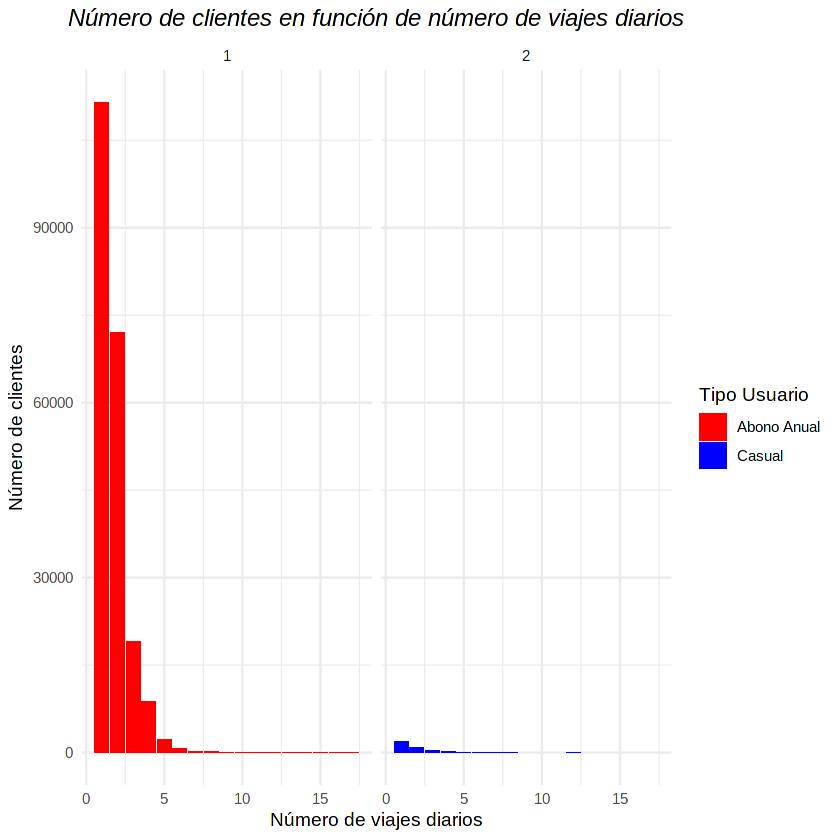

In [51]:
ggplot(travelsByClient) + 
    geom_bar(aes(viajes_user, fill=user_type), position = "dodge") + 
    facet_wrap( ~ user_type) +
    labs(fill = "Tipo Usuario") +
    scale_fill_manual(labels = c( "Abono Anual", "Casual" ), values=c('red','blue')) +
    xlab("Número de viajes diarios") +
    ylab("Número de clientes") +
    theme_minimal() +
    ggtitle("Número de clientes en función de número de viajes diarios") + 
    theme( plot.title = element_text(color="black", size=14, face="italic", hjust = 0.5))

Vemos que tanto en los clientes con Abono Anual, como en los clientes Casuales el número de viajes diarios no supera los 17 ( y estos corresponden a datos atipicos). Realmente con **menos de 5 viajes diarios tenemos el 97% de los clientes** 

In [52]:
100*table(travelsByClient$viajes_user)/nrow(travelsByClient)


           1            2            3            4            5            6 
5.197883e+01 3.342400e+01 8.847840e+00 4.115904e+00 1.086199e+00 3.233826e-01 
           7            8            9           10           11           12 
1.247661e-01 4.953947e-02 2.339364e-02 1.100877e-02 5.045686e-03 3.669590e-03 
          13           14           15           16           17 
2.293494e-03 1.376096e-03 1.376096e-03 9.173975e-04 4.586988e-04 

Analizaremos ahora el tiempo empleado en cada viaje. ( Habiendo eliminado los datos de trabajadores y usuarios desconocidos que podrían distorsionar nuestro estudio )

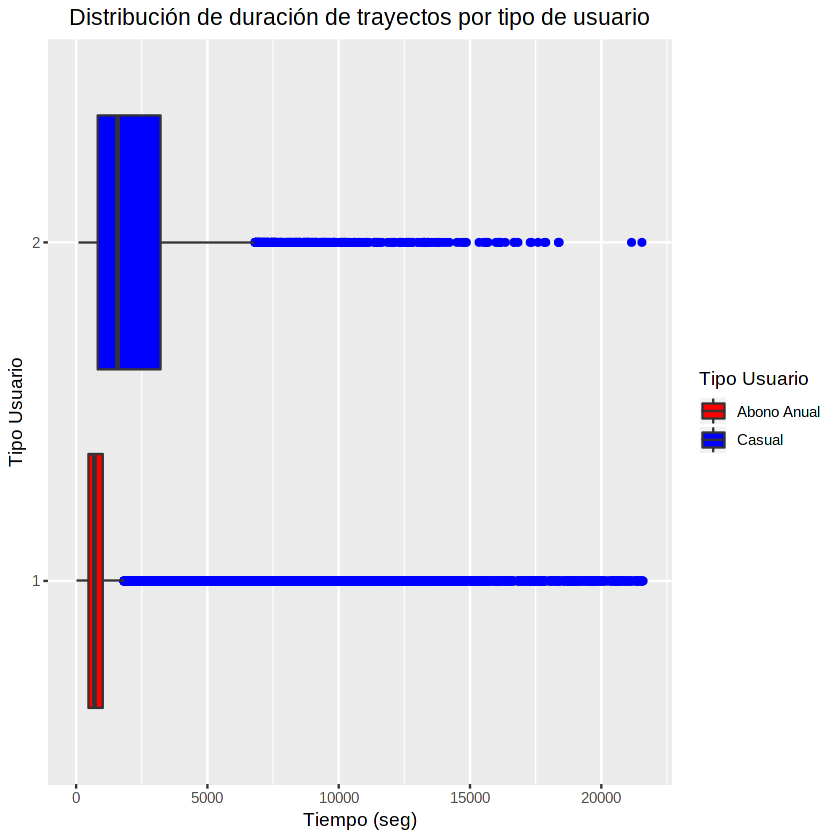

In [53]:
ggplot(biciDataClientes, aes(x = user_type, y = travel_time, fill = user_type )) + 
    geom_boxplot(outlier.colour = "blue") + 
    labs(fill = "Tipo Usuario") +
    scale_fill_manual(labels = c( "Abono Anual", "Casual" ), values=c('red','blue')) +
    coord_flip() + 
    ggtitle("Distribución de duración de trayectos por tipo de usuario") + 
    theme(plot.title = element_text(hjust = 0.5)) + ylab("Tiempo (seg)") + xlab("Tipo Usuario") 


In [54]:
summary(biciDataClientes$travel_time[biciDataClientes$user_type == 1 ])

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    5.0   469.0   694.0   921.4  1014.0 21590.0 

In [55]:
summary(biciDataClientes$travel_time[biciDataClientes$user_type == 2 ])

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
     73     822    1586    2474    3214   21546 

Vemos que el tiempo medio y Q1 y Q3, empleados por los usuarios con abono son mucho menores que el tiempo empleado por usuarios Casuales, lo cual refuerza la teoria de que los usuarios con abono anual utilizan el servicio para ir a trabajar, van directos y no se 'recrean' en el trayecto.

Veamos la misma distribución de tiempos pero segmentada por días de la semana

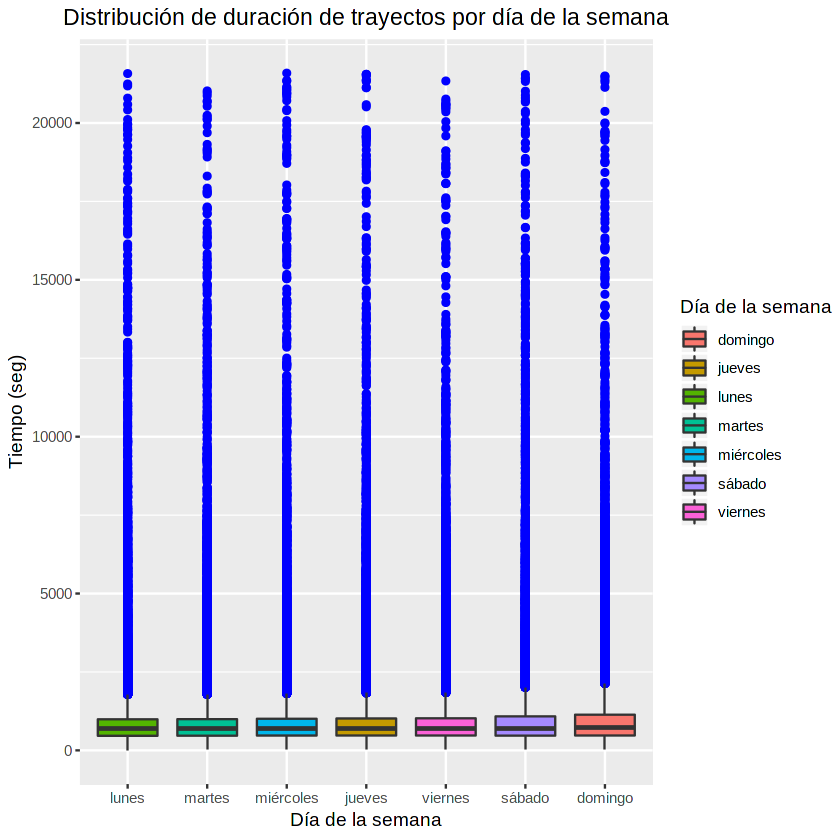

In [56]:
position <- c("lunes","martes","miércoles","jueves","viernes","sábado","domingo")
ggplot(biciDataClientes, aes(x = unplug_dayOfWeek, y = travel_time, fill = unplug_dayOfWeek )) + 
    geom_boxplot(outlier.colour = "blue") + 
    labs(fill = "Día de la semana") +
    scale_x_discrete(limits = position) +
    ggtitle("Distribución de duración de trayectos por día de la semana") + 
    theme(plot.title = element_text(hjust = 0.5)) + ylab("Tiempo (seg)") + xlab("Día de la semana") 

En este caso podemos ver que la mediana de uso ronda los 600 segundos y es independiente del día de la semana ( si bien es cierto que se aprecia un ligero aumento de la mediana y el Q3 durante el fin de semana.

Veamos la edad de nuestros usuarios. Para ello tenemos los datos codificados con una etiqueta que responde a la  siguiente parametrización:
- 0: No se ha podido determinar el rango de edad del usuario 
- 1: El usuario tiene entre 0 y 16 años 
- 2: El usuario tiene entre 17 y 18 años 
- 3: El usuario tiene entre 19 y 26 años 
- 4: El usuario tiene entre 27 y 40 años 
- 5: El usuario tiene entre 41 y 65 años 
- 6: El usuario tiene 66 años o más



In [57]:
summary(biciDataClientes$ageRange)

1      2      3      4      5      6   NA's 
   781   4236  23255 115005  70620   1715 157154

Vemos que unicamente sabemos la edad del **58% de nuestros clientes.**.
Eliminemos los datos NA para saber cual es el porcentaje de cada rango de edad:

In [58]:
ageData <- biciDataClientes %>% subset(!is.na(ageRange))
age <- ageData %>%
  group_by(ageRange) %>% 
  summarise(total = n(), percentage = total/nrow(ageData) ) %>%  
  ungroup %>%
  arrange(-total)
age$label <- scales::percent(age$percentage)
age

ageRange,total,percentage,label
4,115005,0.533388680,53.3%
5,70620,0.327532790,32.8%
3,23255,0.107855778,10.8%
2,4236,0.019646402,2.0%
6,1715,0.007954103,0.8%
1,781,0.003622247,0.4%


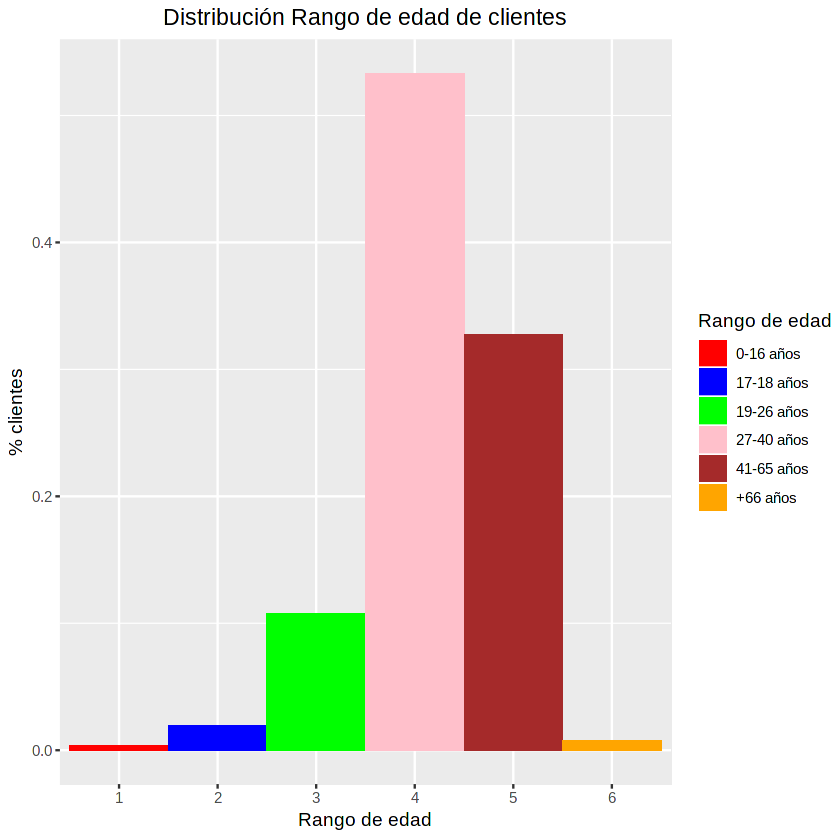

In [59]:
ggplot(data = age)+
    geom_bar(aes(x=ageRange, y=percentage, fill=ageRange), stat="identity", width = 1) +
    labs(fill = "Rango de edad") +
    scale_fill_manual(labels = c( "0-16 años", "17-18 años", "19-26 años", "27-40 años", "41-65 años", "+66 años"), values=c('red','blue', 'green', 'pink', 'brown', 'orange')) +
    ggtitle("Distribución Rango de edad de clientes") + 
    theme(plot.title = element_text(hjust = 0.5)) + ylab("% clientes") + xlab("Rango de edad") 

Vamos a hacer un analisis del código postal de nuestros clientes para ver de donde proceden.
Para ello vamos a descargar un fichero en formato .shapefile de codigos postales de España. Reduciremos este fichero quedandonos con los códigos postales de Madrid ( empiezan por 28 ).
De esta manera sesgamos la muestra, ya que hay datos de usuarios procedentes de diferentes códigos postales de España, pero nos sirve para ver donde viven los más habituales.
Agregaremos a este fichero los datos de usuarios que hacen uso de nuestros servicios,mostrando en un mapa de calor las diferentes procedencias dentro de Madrid.

In [60]:
library(rgdal)



Loading required package: sp
rgdal: version: 1.3-6, (SVN revision 773)
 Geospatial Data Abstraction Library extensions to R successfully loaded
 Loaded GDAL runtime: GDAL 2.2.3, released 2017/11/20
 Path to GDAL shared files: /usr/share/gdal/2.2
 GDAL binary built with GEOS: TRUE 
 Loaded PROJ.4 runtime: Rel. 4.9.3, 15 August 2016, [PJ_VERSION: 493]
 Path to PROJ.4 shared files: (autodetected)
 Linking to sp version: 1.3-1 


In [61]:
zipcode <- readOGR("./zipcodes/codigos_postales.shp", GDAL1_integer64_policy = TRUE)


OGR data source with driver: ESRI Shapefile 
Source: "/home/inyigolopez/workspaceIPythonNotebook/pruebaKeepler/zipcodes/codigos_postales.shp", layer: "codigos_postales"
with 16132 features
It has 4 fields
Integer64 fields read as doubles:  ID_CP 


In [62]:
zipcode <- zipcode[ str_extract(zipcode$COD_POSTAL, "[0-9]{2}") == "28",]

userByZip <- biciDataClientes %>% group_by(zip_code) %>% summarise( USUARIOS_ZIP = n() ) %>% rename( COD_POSTAL = zip_code)
userByZip$COD_POSTAL <- str_extract(userByZip$COD_POSTAL, "[0-9]{5}")
userByZip <- userByZip[!is.na(userByZip$COD_POSTAL),]
userByZip$COD_POSTAL <- as.factor(userByZip$COD_POSTAL)

zipcode <- merge(zipcode, userByZip, by.x = "COD_POSTAL", by.y = "COD_POSTAL", duplicateGeoms = TRUE )


In [63]:
pal <- colorNumeric(
  palette = "YlOrRd",
  domain = zipcode$USUARIOS_ZIP
)

labels <- sprintf(
  "<strong>C.P: %s</strong><br/>%g trayectos",
  zipcode$COD_POSTAL, zipcode$USUARIOS_ZIP
) %>% lapply(htmltools::HTML)

leaflet(zipcode) %>%
      addProviderTiles(providers$CartoDB.Positron) %>%
      addPolygons(color = "#444444", weight = 1, smoothFactor = 0.5,
              opacity = 1.0, fillOpacity = 0.5,
              fillColor = ~colorQuantile("YlOrRd", n=9, USUARIOS_ZIP)(USUARIOS_ZIP),
              highlightOptions = highlightOptions(color = "white", weight = 2, bringToFront = TRUE),
              label = labels,
              labelOptions = labelOptions(
                style = list("font-weight" = "normal", padding = "3px 8px"),
                textsize = "15px",
                direction = "auto")                
            ) %>%
      addLegend("bottomright", pal = pal, values = ~USUARIOS_ZIP,
        title = "Número de trayectos",
        opacity = 1
      )

HTML widgets cannot be represented in plain text (need html)

Veamos ahora el tipo de trayectos más repetidos por nuestros clientes, analizando la densidad de trayectos en los que cojen la bici en la estación A y la dejan en la estación B.
Para eso utilizaremos un mapa de densidad utilizando el packete 'hexbin'.

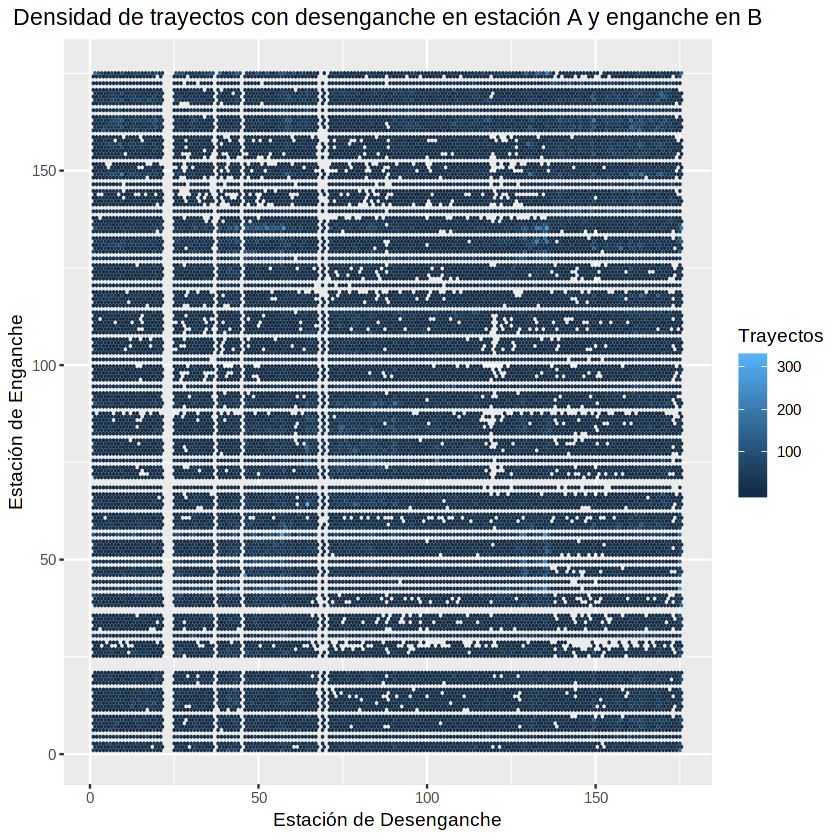

In [64]:
library(hexbin)
ggplot(biciDataClientes, aes(idunplug_station, idplug_station)) + 
    geom_hex(binwidth=1) +
    labs(fill = "Trayectos") +
    ggtitle("Densidad de trayectos con desenganche en estación A y enganche en B") + 
    theme(plot.title = element_text(hjust = 0.5)) + ylab("Estación de Enganche") + xlab("Estación de Desenganche") 

Se puede apreciar en este gráfico que estaciones como la 28 o 29 tienen menos 'enganches' y que estaciones como la 119, 120 tienen menos 'desenganches'.

In [65]:
unplugData <- biciDataClientes %>% subset(!is.na(idunplug_station))
unplug <- unplugData %>%
  group_by(idunplug_station) %>% 
  summarise(total = n(), percentage = total/nrow(unplugData) ) %>%  
  ungroup %>%
  arrange(-total)
head(unplug)
tail(unplug)

idunplug_station,total,percentage
175,5218,0.01399806
163,5177,0.01388807
57,5134,0.01377272
135,4848,0.01300548
149,4671,0.01253065
90,4614,0.01237774


idunplug_station,total,percentage
88,795,0.002132705
120,792,0.002124657
173,765,0.002052226
144,743,0.001993208
119,578,0.001550571
28,566,0.001518379


In [66]:
plugData <- biciDataClientes %>% subset(!is.na(idplug_station))
plug <- plugData %>%
  group_by(idplug_station) %>% 
  summarise(total = n(), percentage = total/nrow(plugData) ) %>%  
  ungroup %>%
  arrange(-total)
head(plug)
tail(plug)

idplug_station,total,percentage
135,6397,0.01716090
175,5611,0.01505234
163,5162,0.01384783
57,4935,0.01323887
129,4838,0.01297865
43,4825,0.01294378


idplug_station,total,percentage
120,714,0.0019154107
88,691,0.0018537098
29,586,0.0015720318
144,585,0.0015693491
119,555,0.0014888697
28,331,0.0008879565


¿ Cual es el trayecto más repetido ?

In [67]:
journeyData <- biciDataClientes %>% subset(!is.na(idunplug_station) && !is.na(idplug_station))
journey <- journeyData %>%
  group_by(idunplug_station, idplug_station) %>% 
  summarise(total = n()) %>%  
  arrange(-total)


In [68]:
head(journey)

idunplug_station,idplug_station,total
64,64,323
135,135,269
57,135,247
132,132,215
135,175,214
46,46,211


Vemos que los trayectos más repetidos son trayectos circulares desde las estación 64 y 135. **La estación 135 corresponde al barrio de 'Rios Rosas'**... 


In [69]:
bikeStations[bikeStations$idStation == 135,]

idStation,address,neighborhood,district,long,lat,totalPlaces,startDate,numberSubstations
135,"SAN JUAN DE LA CRUZ, PLAZA, DE,S/N",07-05 RÍOS ROSAS,07 CHAMBERÍ,-3.6928896,40.441484,24,2015-04-01,1


...sin embargo nos damos cuenta de que **la estación 64 no existe!!!**.

In [70]:
length(unique(biciDataClientes$idplug_station))
length(unique(bikeStations$idStation))

[1] 168

[1] 165

In [71]:
unique(biciDataClientes$idplug_station %>% subset(!biciDataClientes$idplug_station %in% bikeStations$idStation))

[1]  66 171 175 170 172 168  64 169 174 173

In [72]:
biciNoStation <- biciDataClientes %>% subset(idplug_station %in% c( 66, 171, 175, 170, 172, 168, 64, 169, 174, 173 ) | idunplug_station %in% c( 66, 171, 175, 170, 172, 168, 64, 169, 174, 173 ))
nrow(biciNoStation)

[1] 54484

Vemos que hay **10 estaciones de las cuales tenemos datos pero no tenemos Estación y que afecta a 54484 viajes.** ¿ Que ocurre ?

## -- updated --  Retomemos el fichero de estaciones y actualicemoslo

Vamos a acceder al servicio de datos abiertos de EMT-Madrid, que provee de una API y vamos a tratar de recuperar las estaciones a traves de la API, ya que vemos que el copyright de la pagina de biciMAD ( https://u.bicimad.com/mapa ) es de 2014 y puede que las estaciones hayan cambiado de identificador y esten desactualizas.
Nos damos de alta en el servicio y con las credenciales obtenidas accedemos a las estaciones actualizadas, utilizando el packete 'jsonlite' que nos permite transformar el resultado obtenido de formato JSON a Dataframe

In [73]:
newStations <- jsonlite::fromJSON(jsonlite::fromJSON("https://rbdata.emtmadrid.es:8443/BiciMad/get_stations/WEB.SERV.inyigolopez@gmail.com/82B56E8E-81CF-46D0-86B6-F816E085B971/")$data)$stations


In [74]:
head(newStations)

id,latitude,longitude,name,light,number,address,activate,no_available,total_bases,dock_bikes,free_bases,reservations_count
1,40.4168961,-3.7024255,Puerta del Sol A,2,1a,Puerta del Sol nº 1,1,0,24,9,14,0
2,40.4170009,-3.7024207,Puerta del Sol B,0,1b,Puerta del Sol nº 1,1,0,24,6,18,0
3,40.4205886,-3.7058415,Miguel Moya,0,2,Calle Miguel Moya nº 1,1,0,24,6,18,0
4,40.4302937,-3.7069171,Plaza Conde Suchil,2,3,Plaza del Conde Suchil nº 2-4,1,0,18,12,6,0
5,40.4285524,-3.7025875,Malasaña,0,4,Calle Manuela Malasaña nº 5,1,0,24,1,20,0
6,40.4285280,-3.7020599,Fuencarral,0,5,Calle Fuencarral nº 108,1,0,27,2,24,0


Efectivamente, vemos que la nomenclatura de las estaciones ha cambiado y hay un campo llamado 'number' que asocia el identificador antiguo con el nuevo.
Recarguemos el fichero de estaciones y agrupemos las estaciones buenas, ya que **el trabajo de unificación del principio parece no tener mucho sentido ahora**.

In [75]:
newbikeStations <- biciBases %>% select(Número, Distrito, Barrio, FechaAlta) %>% rename(neighborhood = Barrio, district = Distrito, startDate = FechaAlta)

extractID <- function(x) str_extract(x, "[1-9][0-9]*[a-d]{0,1}")
newbikeStations$number <- sapply( newbikeStations[["Número"]], extractID )

newbikeStations[["Número"]] <- NULL
newbikeStations <- newbikeStations %>% group_by(number) %>% summarize(district = district[1], neighborhood = neighborhood[1], startDate = startDate[1]) %>% arrange(number)
newbikeStations$number[newbikeStations$number == '20'] <- '20a'



In [76]:
bikeStations <- left_join(newStations, newbikeStations, by="number" )
head(bikeStations)

id,latitude,longitude,name,light,number,address,activate,no_available,total_bases,dock_bikes,free_bases,reservations_count,district,neighborhood,startDate
1,40.4168961,-3.7024255,Puerta del Sol A,2,1a,Puerta del Sol nº 1,1,0,24,9,14,0,01 CENTRO,01-06 SOL,2014-06-23
2,40.4170009,-3.7024207,Puerta del Sol B,0,1b,Puerta del Sol nº 1,1,0,24,6,18,0,01 CENTRO,01-06 SOL,2014-06-23
3,40.4205886,-3.7058415,Miguel Moya,0,2,Calle Miguel Moya nº 1,1,0,24,6,18,0,01 CENTRO,01-05 UNIVERSIDAD,2014-06-23
4,40.4302937,-3.7069171,Plaza Conde Suchil,2,3,Plaza del Conde Suchil nº 2-4,1,0,18,12,6,0,07 CHAMBERÍ,07-02 ARAPILES,2014-06-23
5,40.4285524,-3.7025875,Malasaña,0,4,Calle Manuela Malasaña nº 5,1,0,24,1,20,0,01 CENTRO,01-05 UNIVERSIDAD,2014-06-23
6,40.4285280,-3.7020599,Fuencarral,0,5,Calle Fuencarral nº 108,1,0,27,2,24,0,01 CENTRO,01-04 JUSTICIA,2014-06-23


Guardamos el dataframe de estaciones actualizadas como .csv por si persiesemos el acceso a la API de EMT. 

In [77]:
write.table(bikeStations, file = "./data/bases_bicimad_updated.csv", append = FALSE, quote = TRUE, sep = ";", eol = "\n", na = "NA", dec = ".", row.names = F, col.names = T, qmethod = c("escape", "double"), fileEncoding = "UTF-8")

Podriamos ahora ejecutar de nuevo los analisis de estaciones anteriores con el fichero de estaciones ya actualizado. ( teniendo en cuenta que hay nombres de variables diiferentes y nuevas variable añadidas )

In [78]:
leaflet(data = bikeStations, height = "700px") %>% 
    addTiles() %>% 
#    addProviderTiles(providers$Stamen.Toner) %>%
    #addProviderTiles(providers$CartoDB.Positron) %>%
    addMarkers( ~as.numeric(as.character(longitude)), ~as.numeric(as.character(latitude)), popup = ~address, label = ~as.character(neighborhood))

HTML widgets cannot be represented in plain text (need html)

## -- /updated -- 

In [79]:
bikeStations[bikeStations$id %in% c(64,135),]

,id,latitude,longitude,name,light,number,address,activate,no_available,total_bases,dock_bikes,free_bases,reservations_count,district,neighborhood,startDate
63,64,40.4197520,-3.6883980,Plaza de la Independencia,2,60,Plaza de la Independencia nº 6,1,0,24,11,11,0,03 RETIRO,03-05 JERÓNIMOS,2014-06-23
170,135,40.3919385,-3.6971829,Entrada Matadero,1,165,Paseo de la Chopera nº 14,1,0,27,25,1,0,02 ARGANZUELA,02-03 CHOPERA,2015-07-01


Tras la actualización de las estaciones vemos que los trayectos más repetidos **no corresponden al barrio de 'Rios Rosas', sino a 'Chopera' (135) y 'Jeronimos' (64)**. 

Podemos ver por último, como se mueven las bicis entre los distintos distritos

In [80]:
districts <- bikeStations %>% select(id, district)
links <- biciDataClientes %>% group_by(idunplug_station,idplug_station) %>% summarise(value = n() ) %>% rename(id = idunplug_station, target = idplug_station )

movement <- left_join(links, districts, by = "id") %>% rename(source = id, id = target, unplug_district = district )
movement <- left_join(movement, districts, by= "id")  %>% rename(target = id, plug_district = district )
movement <- movement %>% select (unplug_district, plug_district, value ) %>% group_by(unplug_district, plug_district) %>% summarise(value = sum(value, rm.na=T))
movement <- movement[!is.na(movement$unplug_district) & !is.na(movement$plug_district),] %>% ungroup()
head(movement)

Adding missing grouping variables: `source`


unplug_district,plug_district,value
01 CENTRO,01 CENTRO,55454
01 CENTRO,02 ARGANZUELA,16357
01 CENTRO,03 RETIRO,16430
01 CENTRO,04 SALAMANCA,12535
01 CENTRO,05 CHAMARTÍN,3921
01 CENTRO,06 TETUÁN,2778


Warning message in to_lodes_form(data = data, axes = axis_ind, discern = params$discern):
“Some strata appear at multiple axes.”Warning message in to_lodes_form(data = data, axes = axis_ind, discern = params$discern):
“Some strata appear at multiple axes.”Warning message in to_lodes_form(data = data, axes = axis_ind, discern = params$discern):
“Some strata appear at multiple axes.”

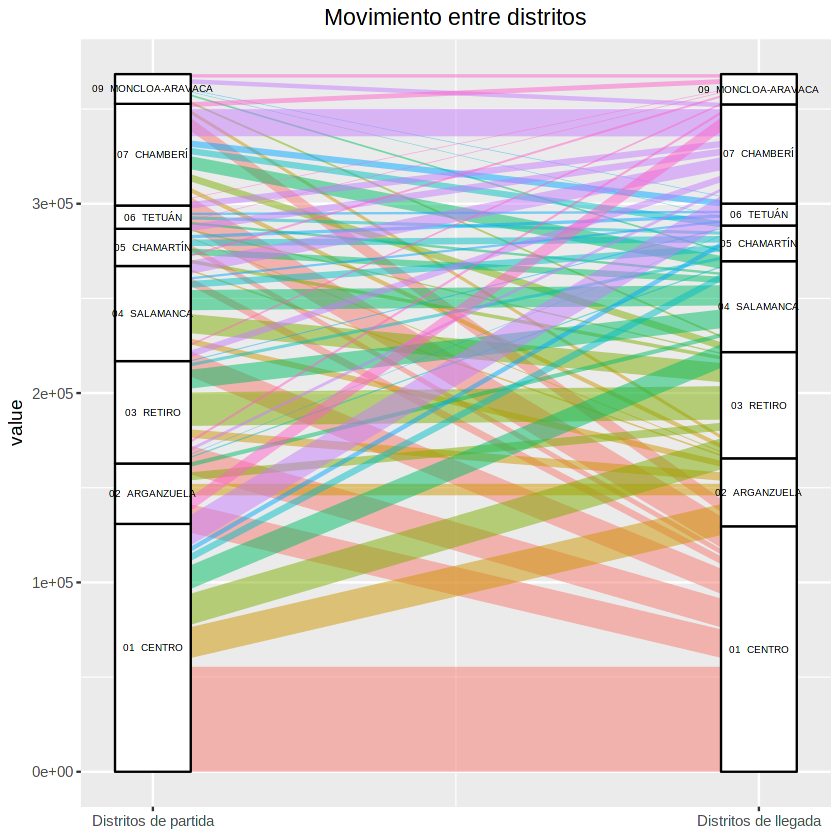

In [81]:
library(ggalluvial)
ggplot(movement,
       aes(y = value,
           axis1 = unplug_district, axis2 = plug_district)) +
      geom_alluvium(aes(fill = plug_district),
                width = 0, knot.pos = 0, reverse = FALSE) +
    guides(fill = FALSE) +
    geom_stratum(width = 1/8, reverse = FALSE) +
    geom_text(stat = "stratum", label.strata = TRUE, reverse = F, size= 2) +
    scale_x_continuous(breaks = 1:2, labels = c("Distritos de partida", "Distritos de llegada")) +
    ggtitle("Movimiento entre distritos") + 
    theme(plot.title = element_text(hjust = 0.5))